In [1]:
import pandas as pd
import os
import seaborn as sn
import plotly.graph_objects as go
from datetime import datetime
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from matplotlib import pyplot as plt
import numpy as np
from tensorflow import keras
import tensorflow_hub as hub

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
df_list=[]
for i in os.listdir(r'./etf/Instruments'):
    for j in os.listdir(r'./etf/Instruments/'+i):
        size = len(j)
        name = j[:size - 4]
        globals()[name] = pd.read_csv(r'./etf/Instruments/'+i+'/'+j)
        globals()[name].dfname = name
        df_list.append(globals()[name])

In [4]:
for i in df_list:
    i['Datetime'] = i['Date'] + ' ' + i['Time']
    i.drop('Date', inplace = True, axis = 1)
    i.drop('Time', inplace = True, axis = 1)
    i.set_index('Datetime', inplace = True)
    print(i.dfname)
    print(i.describe())
    print('\n')

AIA_60_min
               Open          High           Low         Close           Vol  \
count  24006.000000  24006.000000  24006.000000  24006.000000  2.400600e+04   
mean      52.382089     52.451007     52.302973     52.375709  4.145420e+03   
std       14.995689     15.012361     14.980149     14.999592  2.413554e+04   
min       19.890000     20.020000     19.740000     20.000000  0.000000e+00   
25%       43.010000     43.070000     42.942500     43.010000  4.000000e+02   
50%       47.790000     47.830000     47.730000     47.780000  1.230000e+03   
75%       60.930000     60.990000     60.880000     60.930000  3.500000e+03   
max      102.500000    102.500000    102.210000    102.430000  2.908790e+06   

                  OI           ADX     TrigLevel           Avg        AvgExp  \
count   24006.000000  24006.000000  24006.000000  24006.000000  24006.000000   
mean     4051.868283     28.029623     18.988128     52.135032     52.440724   
std     15906.905864     10.501571   

AIA_60_min


AIA_daily


AOR_60_min


AOR_daily


EPP_60_min


EPP_daily


EWG_60_min


EWG_daily




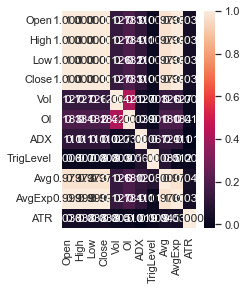

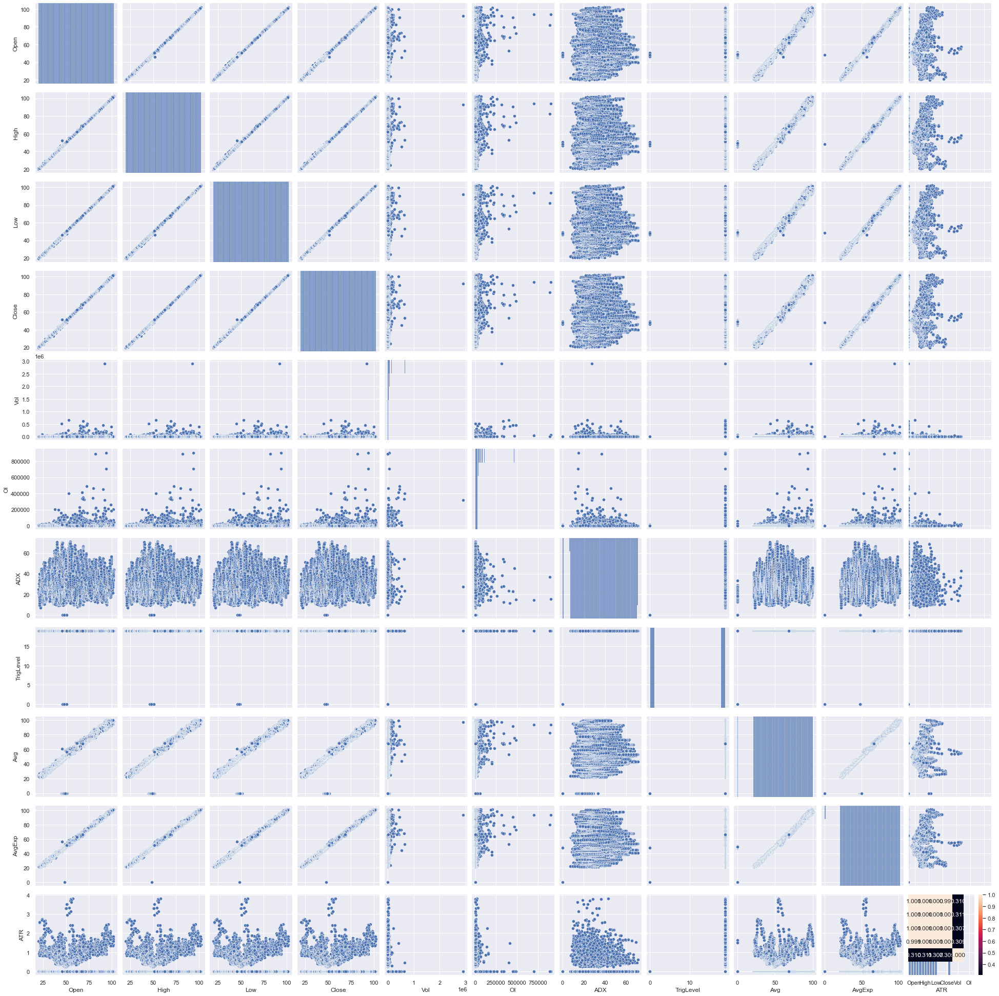

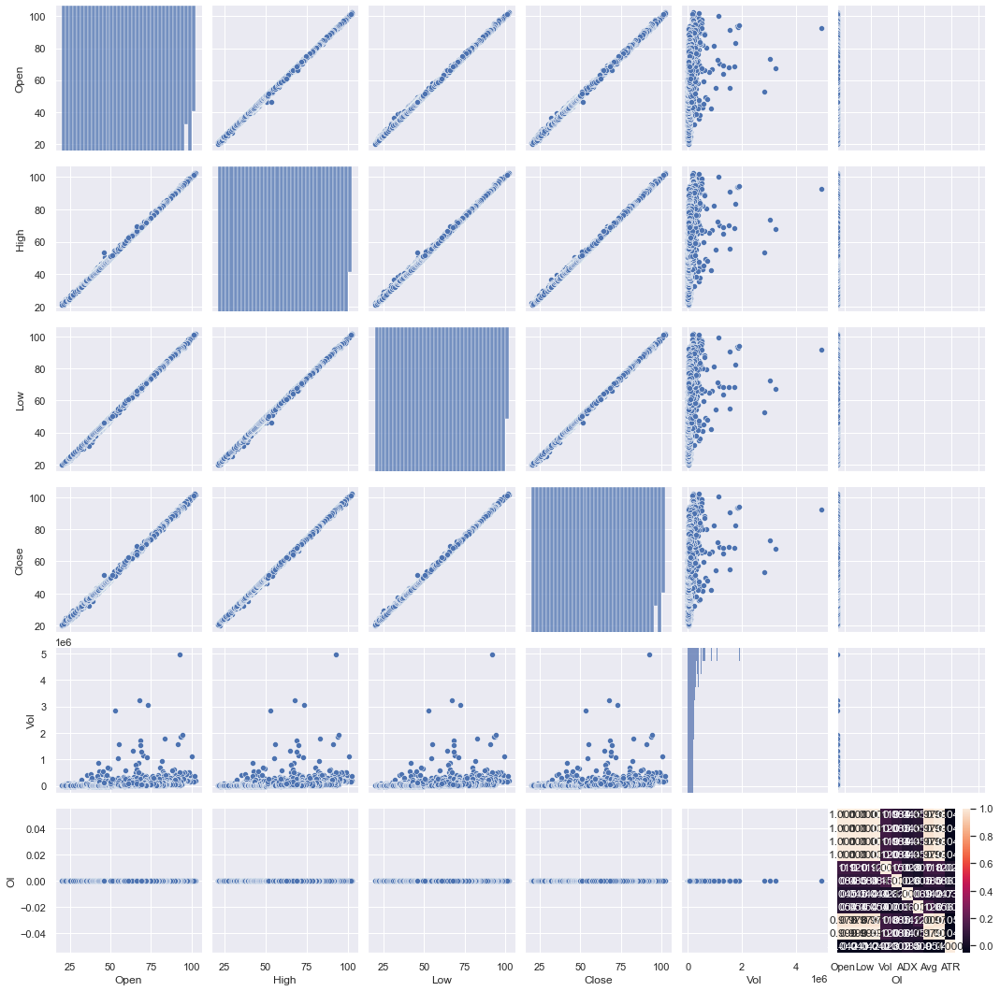

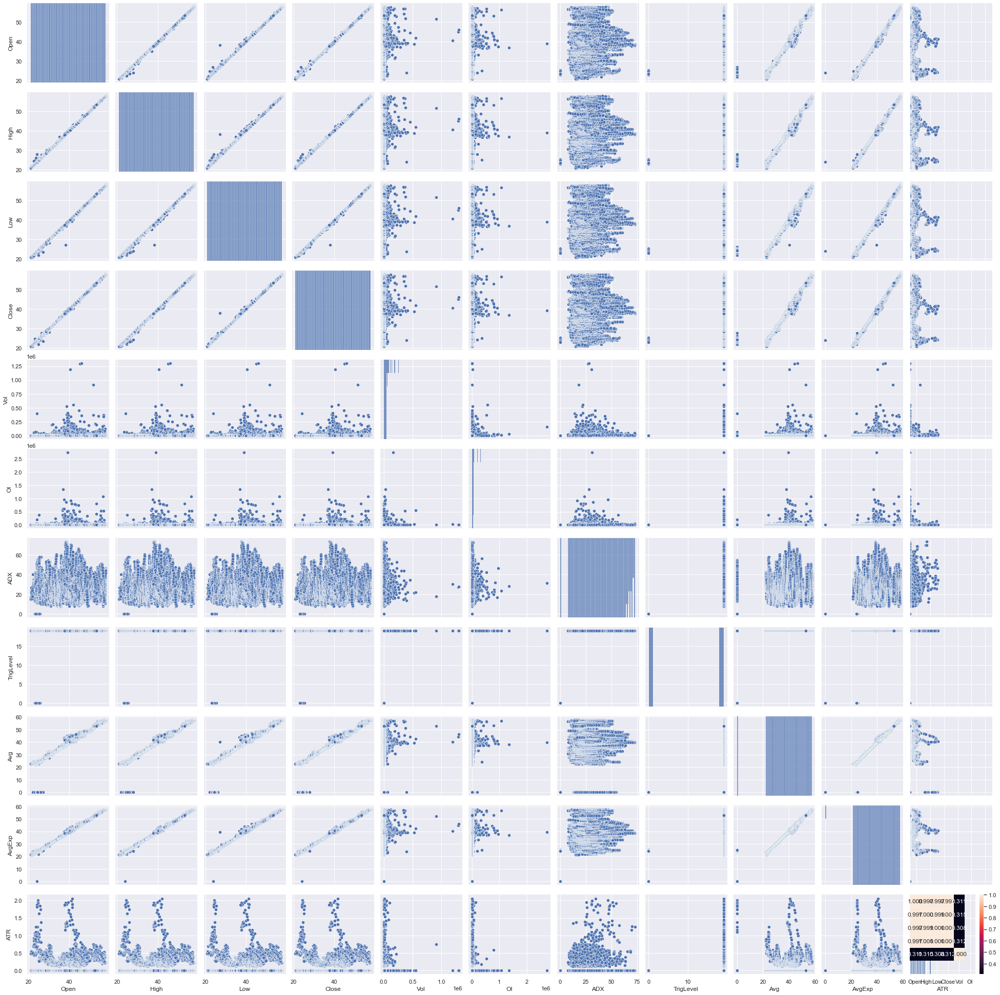

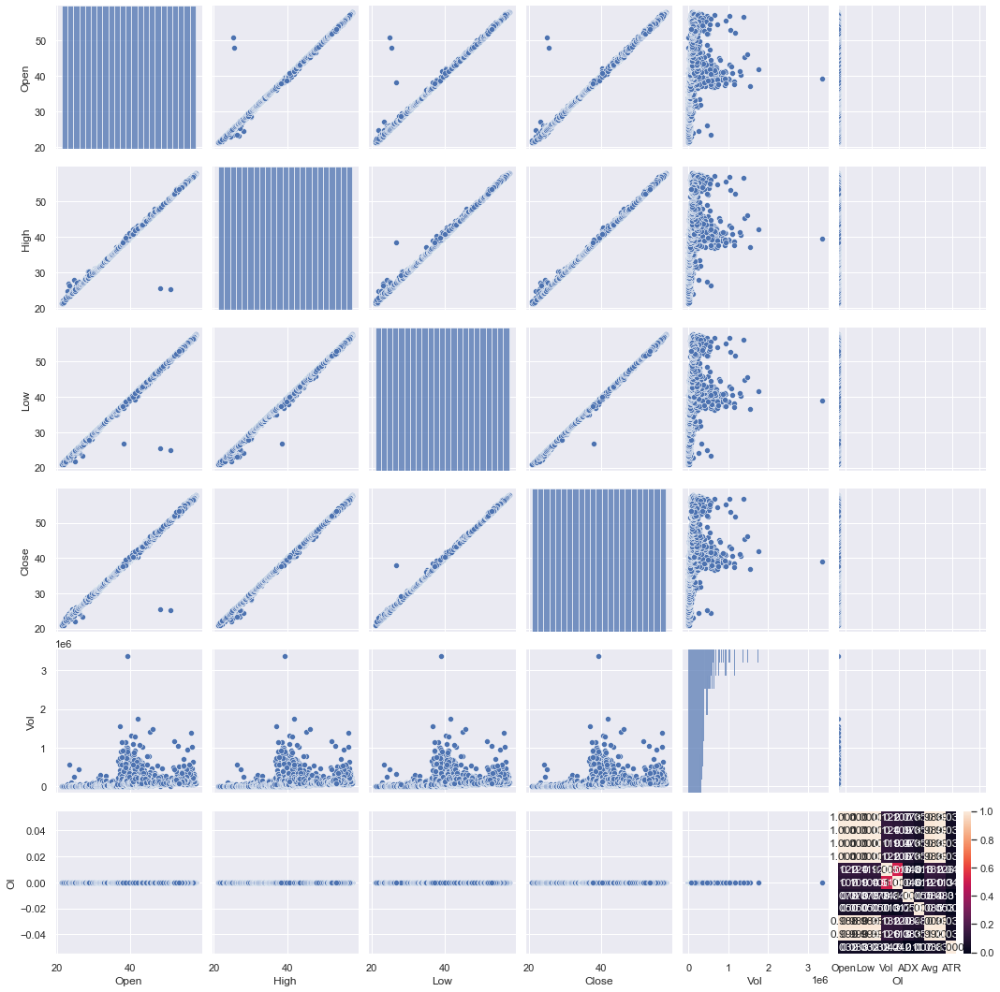

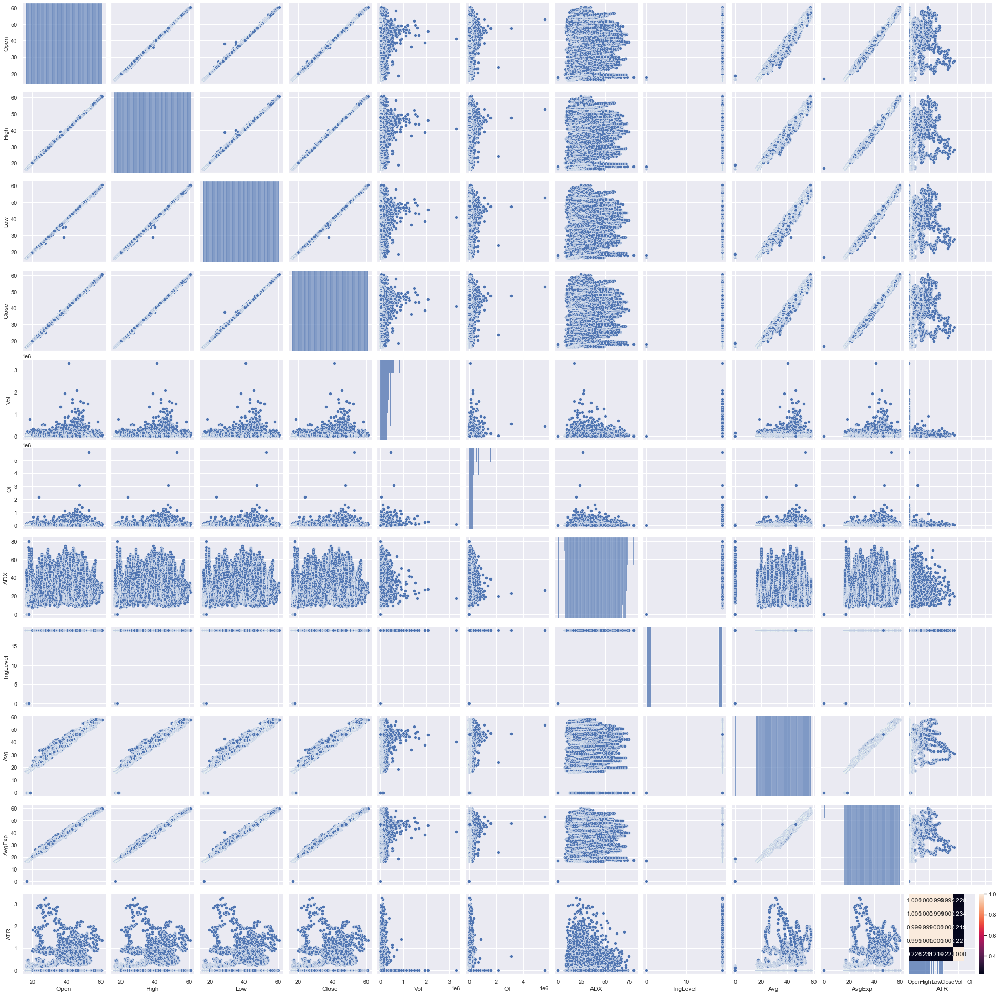

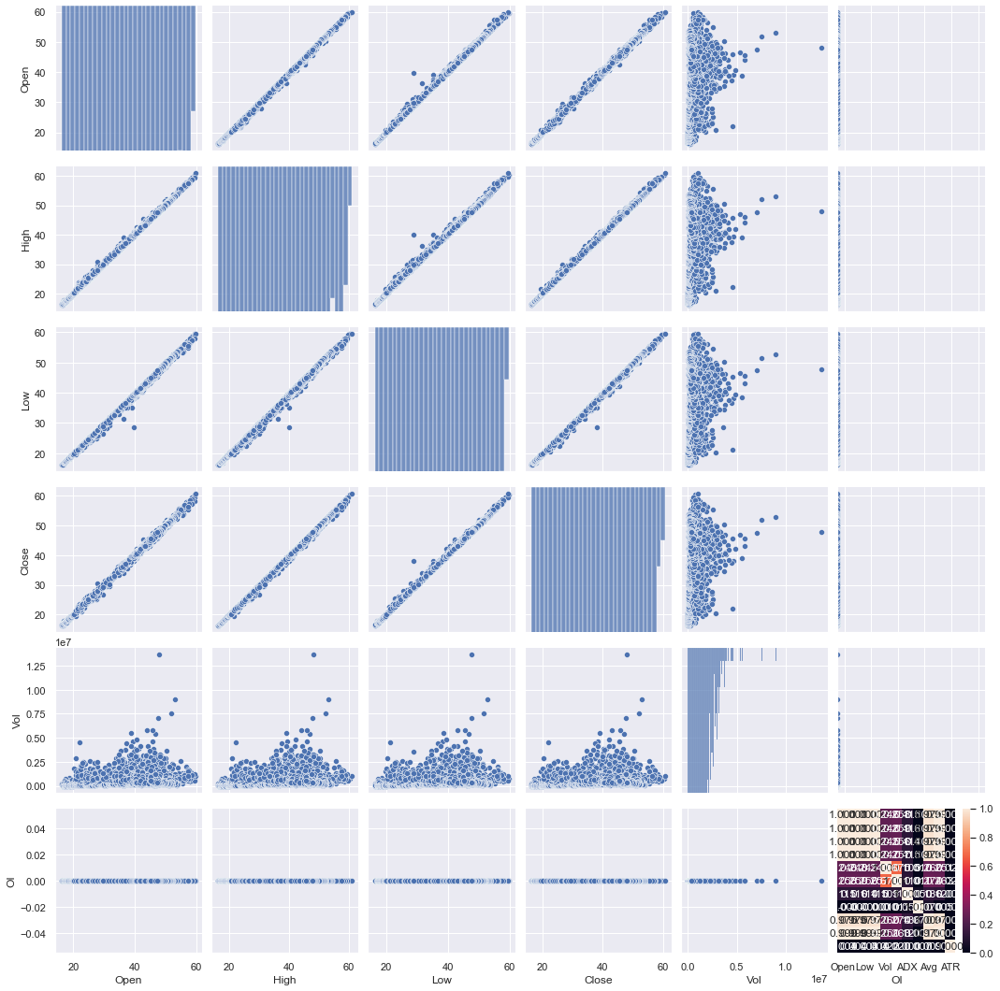

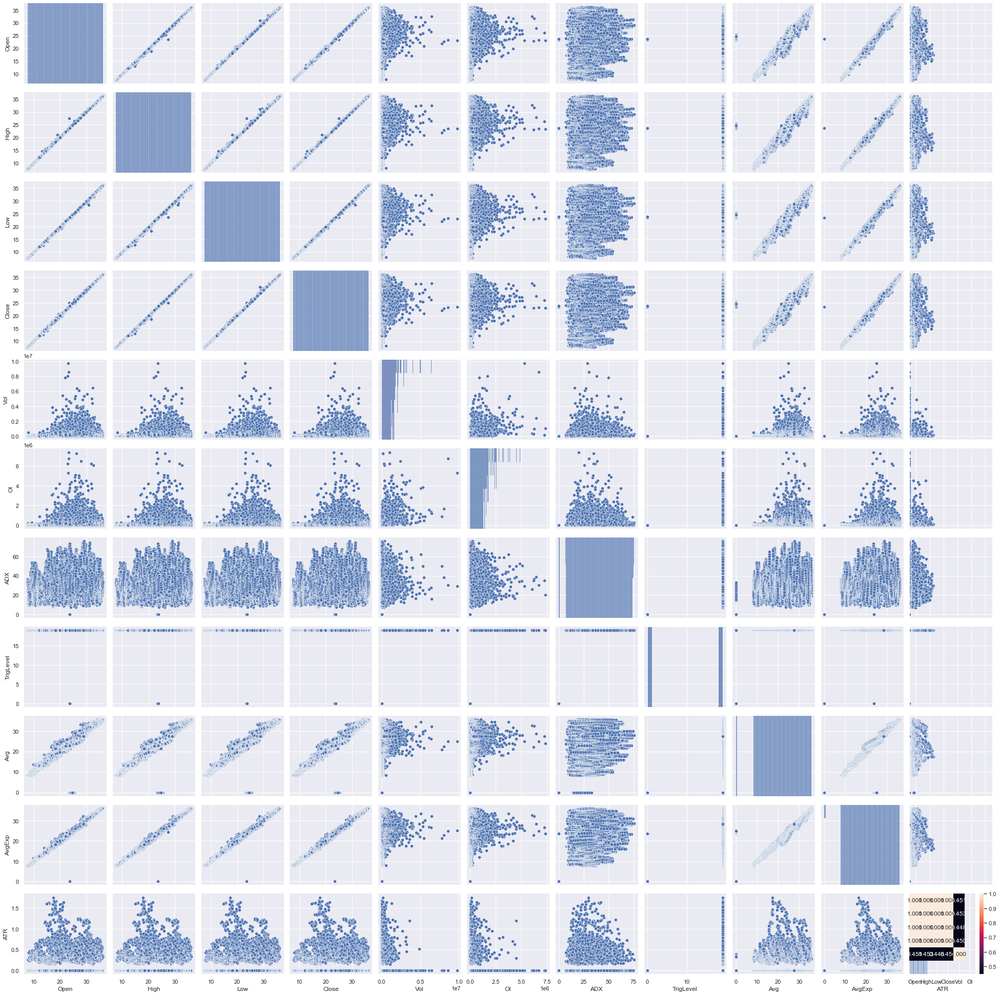

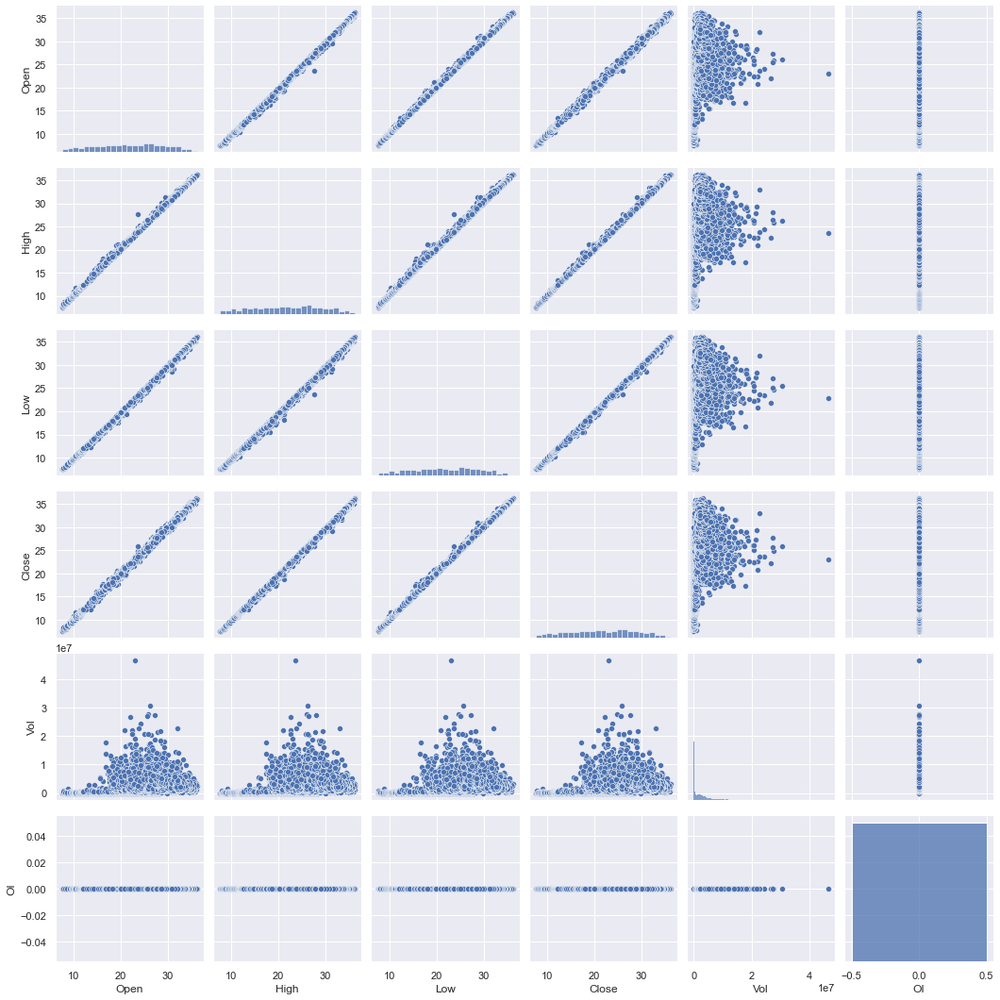

In [5]:
for i in df_list:
    corr_matrix = i.corr()
    print(i.dfname)
    #Using heatmap to visualize the correlation matrix
    sn.set(rc={"figure.figsize":(3, 4)})
    sn.heatmap(corr_matrix, annot=True, fmt=".3f")
    print('\n')
    sn.pairplot(i)

In [6]:
for i in df_list:
    if(i.dfname.endswith('daily')):
        fig = go.Figure(data=[go.Candlestick(x=i.index,
                        open=i.Open,
                        high=i.High ,
                        low=i.Low,
                        close=i.Close)])
        fig.show()

In [5]:
train_X_list=[]
test_X_list=[]
train_y_list=[]
test_y_list=[]
for i in df_list:
    for j in range(4):
        '''
        print(i.drop(i.columns[j+2], axis=1))
        print(i.columns[j+2])
        '''
        
        X = i.drop(i.columns[j], axis=1).values
        y = i.iloc[:,j].values

        X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.3, random_state = 100)
        train_X_list.append(X_train)
        test_X_list.append(X_test)
        train_y_list.append(y_train)
        test_y_list.append(y_test)

In [6]:
scaled_train_X=[]
scaled_test_X=[]
for i in train_X_list:
    sc = MinMaxScaler(feature_range = (0, 1))
    training_scaled = sc.fit_transform(i)
    scaled_train_X.append(training_scaled)

for j in test_X_list:
    sc = MinMaxScaler(feature_range = (0, 1))
    training_scaled = sc.fit_transform(j)
    scaled_test_X.append(training_scaled)

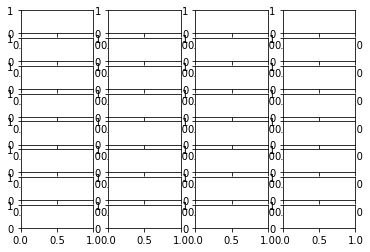

In [7]:
figure, axis = plt.subplots(8, 4)

In [9]:
os.chdir(r'./models/')

In [10]:
model_names_list = []
counter = 0
for b in range(4):
    for i in range(8):
        predicted_price = 'predicted_price_'+str(i)
        model_name = 'model_'+str(df_list[i].dfname)+'_'+str(b)
        model_names_list.append(model_name)
        print(model_name)
        globals()[model_name] = Sequential()
        globals()[model_name].add(LSTM(units = 50, return_sequences = True, input_shape = (scaled_train_X[counter].shape[1], 1)))
        globals()[model_name].add(Dropout(0.2))
        globals()[model_name].add(LSTM(units = 50, return_sequences = True))
        globals()[model_name].add(Dropout(0.2))
        globals()[model_name].add(LSTM(units = 50, return_sequences = True))
        globals()[model_name].add(Dropout(0.2))
        globals()[model_name].add(LSTM(units = 50))
        globals()[model_name].add(Dropout(0.2))
        globals()[model_name].add(Dense(units = 1))
        globals()[model_name].compile(optimizer = 'adam', loss = 'mean_squared_error')
        globals()[model_name].fit(scaled_train_X[counter], train_y_list[counter], epochs = 100, batch_size = 32)
        globals()[model_name].save(model_name)
        counter+=1

model_AIA_60_min_0
Epoch 1/100
526/526 [==============================] - 12s 13ms/step - loss: 1264.6914
Epoch 2/100
526/526 [==============================] - 7s 13ms/step - loss: 399.0884
Epoch 3/100
526/526 [==============================] - 7s 13ms/step - loss: 251.9687
Epoch 4/100
526/526 [==============================] - 7s 13ms/step - loss: 237.9070
Epoch 5/100
526/526 [==============================] - 7s 14ms/step - loss: 188.7656
Epoch 6/100
526/526 [==============================] - 7s 14ms/step - loss: 73.9260
Epoch 7/100
526/526 [==============================] - 7s 14ms/step - loss: 44.5511
Epoch 8/100
526/526 [==============================] - 7s 13ms/step - loss: 29.9006
Epoch 9/100
526/526 [==============================] - 7s 13ms/step - loss: 24.0663
Epoch 10/100
526/526 [==============================] - 7s 13ms/step - loss: 20.3229
Epoch 11/100
526/526 [==============================] - 7s 13ms/step - loss: 18.2068
Epoch 12/100
526/526 [==========================

INFO:tensorflow:Assets written to: model_AIA_60_min_0\assets


INFO:tensorflow:Assets written to: model_AIA_60_min_0\assets


model_AIA_daily_0
Epoch 1/100
526/526 [==============================] - 11s 13ms/step - loss: 1266.7665
Epoch 2/100
526/526 [==============================] - 7s 13ms/step - loss: 415.0251
Epoch 3/100
526/526 [==============================] - 7s 13ms/step - loss: 256.1162
Epoch 4/100
526/526 [==============================] - 7s 13ms/step - loss: 240.4189
Epoch 5/100
526/526 [==============================] - 7s 13ms/step - loss: 239.9893
Epoch 6/100
526/526 [==============================] - 7s 13ms/step - loss: 117.2169
Epoch 7/100
526/526 [==============================] - 7s 13ms/step - loss: 54.7149
Epoch 8/100
526/526 [==============================] - 7s 13ms/step - loss: 35.7661
Epoch 9/100
526/526 [==============================] - 7s 13ms/step - loss: 26.4488
Epoch 10/100
526/526 [==============================] - 7s 13ms/step - loss: 22.1715
Epoch 11/100
526/526 [==============================] - 7s 13ms/step - loss: 19.6960
Epoch 12/100
526/526 [==========================

INFO:tensorflow:Assets written to: model_AIA_daily_0\assets


INFO:tensorflow:Assets written to: model_AIA_daily_0\assets


model_AOR_60_min_0
Epoch 1/100
526/526 [==============================] - 12s 16ms/step - loss: 1404.1149
Epoch 2/100
526/526 [==============================] - 8s 16ms/step - loss: 464.9027
Epoch 3/100
526/526 [==============================] - 8s 15ms/step - loss: 264.0316
Epoch 4/100
526/526 [==============================] - 8s 16ms/step - loss: 238.5451
Epoch 5/100
526/526 [==============================] - 8s 15ms/step - loss: 240.2152
Epoch 6/100
526/526 [==============================] - 8s 16ms/step - loss: 123.0022
Epoch 7/100
526/526 [==============================] - 8s 15ms/step - loss: 57.8196
Epoch 8/100
526/526 [==============================] - 8s 15ms/step - loss: 35.9218
Epoch 9/100
526/526 [==============================] - 8s 15ms/step - loss: 27.3484
Epoch 10/100
526/526 [==============================] - 8s 15ms/step - loss: 21.8558
Epoch 11/100
526/526 [==============================] - 8s 15ms/step - loss: 19.4978
Epoch 12/100
526/526 [=========================

INFO:tensorflow:Assets written to: model_AOR_60_min_0\assets


INFO:tensorflow:Assets written to: model_AOR_60_min_0\assets


model_AOR_daily_0
Epoch 1/100
526/526 [==============================] - 12s 14ms/step - loss: 1347.0796
Epoch 2/100
526/526 [==============================] - 8s 15ms/step - loss: 429.1909
Epoch 3/100
526/526 [==============================] - 8s 15ms/step - loss: 258.6732
Epoch 4/100
526/526 [==============================] - 7s 14ms/step - loss: 240.2660
Epoch 5/100
526/526 [==============================] - 8s 14ms/step - loss: 239.9534
Epoch 6/100
526/526 [==============================] - 8s 15ms/step - loss: 127.2368
Epoch 7/100
526/526 [==============================] - 8s 14ms/step - loss: 55.9784
Epoch 8/100
526/526 [==============================] - 7s 14ms/step - loss: 34.7725
Epoch 9/100
526/526 [==============================] - 7s 14ms/step - loss: 26.2470
Epoch 10/100
526/526 [==============================] - 7s 14ms/step - loss: 20.9425
Epoch 11/100
526/526 [==============================] - 7s 14ms/step - loss: 18.7395
Epoch 12/100
526/526 [==========================

INFO:tensorflow:Assets written to: model_AOR_daily_0\assets


INFO:tensorflow:Assets written to: model_AOR_daily_0\assets


model_EPP_60_min_0
Epoch 1/100
79/79 [==============================] - 5s 8ms/step - loss: 2318.2502
Epoch 2/100
79/79 [==============================] - 1s 9ms/step - loss: 1662.2402
Epoch 3/100
79/79 [==============================] - 1s 9ms/step - loss: 1364.4099
Epoch 4/100
79/79 [==============================] - 1s 9ms/step - loss: 1127.4047
Epoch 5/100
79/79 [==============================] - 1s 9ms/step - loss: 932.7625
Epoch 6/100
79/79 [==============================] - 1s 9ms/step - loss: 778.2278
Epoch 7/100
79/79 [==============================] - 1s 9ms/step - loss: 649.4451
Epoch 8/100
79/79 [==============================] - 1s 9ms/step - loss: 546.1375
Epoch 9/100
79/79 [==============================] - 1s 9ms/step - loss: 465.8360
Epoch 10/100
79/79 [==============================] - 1s 9ms/step - loss: 406.2086
Epoch 11/100
79/79 [==============================] - 1s 9ms/step - loss: 356.3474
Epoch 12/100
79/79 [==============================] - 1s 9ms/step - loss:

INFO:tensorflow:Assets written to: model_EPP_60_min_0\assets


INFO:tensorflow:Assets written to: model_EPP_60_min_0\assets


model_EPP_daily_0
Epoch 1/100
79/79 [==============================] - 5s 8ms/step - loss: 2356.4248
Epoch 2/100
79/79 [==============================] - 1s 8ms/step - loss: 1681.4723
Epoch 3/100
79/79 [==============================] - 1s 8ms/step - loss: 1383.2286
Epoch 4/100
79/79 [==============================] - 1s 8ms/step - loss: 1142.3392
Epoch 5/100
79/79 [==============================] - 1s 8ms/step - loss: 950.1808
Epoch 6/100
79/79 [==============================] - 1s 9ms/step - loss: 787.7378
Epoch 7/100
79/79 [==============================] - 1s 8ms/step - loss: 661.0922
Epoch 8/100
79/79 [==============================] - 1s 8ms/step - loss: 557.6223
Epoch 9/100
79/79 [==============================] - 1s 8ms/step - loss: 476.3264
Epoch 10/100
79/79 [==============================] - 1s 8ms/step - loss: 407.1383
Epoch 11/100
79/79 [==============================] - 1s 8ms/step - loss: 358.5786
Epoch 12/100
79/79 [==============================] - 1s 8ms/step - loss: 

INFO:tensorflow:Assets written to: model_EPP_daily_0\assets


INFO:tensorflow:Assets written to: model_EPP_daily_0\assets


model_EWG_60_min_0
Epoch 1/100
79/79 [==============================] - 5s 9ms/step - loss: 2186.1980
Epoch 2/100
79/79 [==============================] - 1s 9ms/step - loss: 1495.1815
Epoch 3/100
79/79 [==============================] - 1s 9ms/step - loss: 1219.4355
Epoch 4/100
79/79 [==============================] - 1s 9ms/step - loss: 1002.1520
Epoch 5/100
79/79 [==============================] - 1s 9ms/step - loss: 834.2220
Epoch 6/100
79/79 [==============================] - 1s 9ms/step - loss: 688.0947
Epoch 7/100
79/79 [==============================] - 1s 9ms/step - loss: 582.0219
Epoch 8/100
79/79 [==============================] - 1s 9ms/step - loss: 493.7012
Epoch 9/100
79/79 [==============================] - 1s 9ms/step - loss: 421.0420
Epoch 10/100
79/79 [==============================] - 1s 9ms/step - loss: 370.9980
Epoch 11/100
79/79 [==============================] - 1s 9ms/step - loss: 331.2456
Epoch 12/100
79/79 [==============================] - 1s 9ms/step - loss:

INFO:tensorflow:Assets written to: model_EWG_60_min_0\assets


INFO:tensorflow:Assets written to: model_EWG_60_min_0\assets


model_EWG_daily_0
Epoch 1/100
79/79 [==============================] - 5s 9ms/step - loss: 2228.4580
Epoch 2/100
79/79 [==============================] - 1s 9ms/step - loss: 1537.9695
Epoch 3/100
79/79 [==============================] - 1s 9ms/step - loss: 1256.4631
Epoch 4/100
79/79 [==============================] - 1s 9ms/step - loss: 1035.8661
Epoch 5/100
79/79 [==============================] - 1s 9ms/step - loss: 851.1761
Epoch 6/100
79/79 [==============================] - 1s 9ms/step - loss: 709.4686
Epoch 7/100
79/79 [==============================] - 1s 9ms/step - loss: 592.7583
Epoch 8/100
79/79 [==============================] - 1s 9ms/step - loss: 501.2979
Epoch 9/100
79/79 [==============================] - 1s 9ms/step - loss: 430.4714
Epoch 10/100
79/79 [==============================] - 1s 9ms/step - loss: 374.8347
Epoch 11/100
79/79 [==============================] - 1s 9ms/step - loss: 331.4548
Epoch 12/100
79/79 [==============================] - 1s 9ms/step - loss: 

INFO:tensorflow:Assets written to: model_EWG_daily_0\assets


INFO:tensorflow:Assets written to: model_EWG_daily_0\assets


model_AIA_60_min_1
Epoch 1/100
485/485 [==============================] - 11s 15ms/step - loss: 539.3725
Epoch 2/100
485/485 [==============================] - 7s 15ms/step - loss: 109.5802
Epoch 3/100
485/485 [==============================] - 7s 15ms/step - loss: 70.4438
Epoch 4/100
485/485 [==============================] - 7s 15ms/step - loss: 69.9225
Epoch 5/100
485/485 [==============================] - 7s 15ms/step - loss: 69.4442
Epoch 6/100
485/485 [==============================] - 7s 15ms/step - loss: 35.0195
Epoch 7/100
485/485 [==============================] - 8s 16ms/step - loss: 14.1393
Epoch 8/100
485/485 [==============================] - 7s 15ms/step - loss: 10.3752
Epoch 9/100
485/485 [==============================] - 7s 15ms/step - loss: 9.4189
Epoch 10/100
485/485 [==============================] - 7s 15ms/step - loss: 9.0288
Epoch 11/100
485/485 [==============================] - 8s 16ms/step - loss: 9.1582
Epoch 12/100
485/485 [==============================] -

INFO:tensorflow:Assets written to: model_AIA_60_min_1\assets


INFO:tensorflow:Assets written to: model_AIA_60_min_1\assets


model_AIA_daily_1
Epoch 1/100
485/485 [==============================] - 11s 14ms/step - loss: 558.8400
Epoch 2/100
485/485 [==============================] - 7s 14ms/step - loss: 110.3248
Epoch 3/100
485/485 [==============================] - 7s 14ms/step - loss: 70.0112
Epoch 4/100
485/485 [==============================] - 7s 15ms/step - loss: 69.6984
Epoch 5/100
485/485 [==============================] - 8s 17ms/step - loss: 69.8165
Epoch 6/100
485/485 [==============================] - 8s 16ms/step - loss: 46.2987
Epoch 7/100
485/485 [==============================] - 9s 18ms/step - loss: 14.9652
Epoch 8/100
485/485 [==============================] - 9s 18ms/step - loss: 10.5222
Epoch 9/100
485/485 [==============================] - 9s 18ms/step - loss: 9.1303
Epoch 10/100
485/485 [==============================] - 9s 18ms/step - loss: 8.7433
Epoch 11/100
485/485 [==============================] - 8s 17ms/step - loss: 8.7842
Epoch 12/100
485/485 [==============================] - 

INFO:tensorflow:Assets written to: model_AIA_daily_1\assets


INFO:tensorflow:Assets written to: model_AIA_daily_1\assets


model_AOR_60_min_1
Epoch 1/100
485/485 [==============================] - 14s 18ms/step - loss: 534.9697
Epoch 2/100
485/485 [==============================] - 9s 18ms/step - loss: 107.0534
Epoch 3/100
485/485 [==============================] - 9s 18ms/step - loss: 71.3339
Epoch 4/100
485/485 [==============================] - 9s 18ms/step - loss: 69.3928
Epoch 5/100
485/485 [==============================] - 9s 18ms/step - loss: 70.2299
Epoch 6/100
485/485 [==============================] - 9s 18ms/step - loss: 39.2612
Epoch 7/100
485/485 [==============================] - 9s 18ms/step - loss: 14.6344
Epoch 8/100
485/485 [==============================] - 9s 18ms/step - loss: 11.0424
Epoch 9/100
485/485 [==============================] - 9s 18ms/step - loss: 9.5069
Epoch 10/100
485/485 [==============================] - 9s 18ms/step - loss: 9.2564
Epoch 11/100
485/485 [==============================] - 9s 18ms/step - loss: 9.2613
Epoch 12/100
485/485 [==============================] -

INFO:tensorflow:Assets written to: model_AOR_60_min_1\assets


INFO:tensorflow:Assets written to: model_AOR_60_min_1\assets


model_AOR_daily_1
Epoch 1/100
485/485 [==============================] - 12s 14ms/step - loss: 568.3297
Epoch 2/100
485/485 [==============================] - 7s 15ms/step - loss: 115.0616
Epoch 3/100
485/485 [==============================] - 7s 15ms/step - loss: 70.7008
Epoch 4/100
485/485 [==============================] - 7s 15ms/step - loss: 70.2732
Epoch 5/100
485/485 [==============================] - 7s 14ms/step - loss: 45.0107
Epoch 6/100
485/485 [==============================] - 7s 14ms/step - loss: 17.7075
Epoch 7/100
485/485 [==============================] - 7s 15ms/step - loss: 12.8887
Epoch 8/100
485/485 [==============================] - 7s 14ms/step - loss: 11.0412
Epoch 9/100
485/485 [==============================] - 7s 14ms/step - loss: 9.7608
Epoch 10/100
485/485 [==============================] - 7s 14ms/step - loss: 9.4635
Epoch 11/100
485/485 [==============================] - 7s 14ms/step - loss: 9.3183
Epoch 12/100
485/485 [==============================] - 

INFO:tensorflow:Assets written to: model_AOR_daily_1\assets


INFO:tensorflow:Assets written to: model_AOR_daily_1\assets


model_EPP_60_min_1
Epoch 1/100
74/74 [==============================] - 5s 9ms/step - loss: 1159.1931
Epoch 2/100
74/74 [==============================] - 1s 9ms/step - loss: 667.0255
Epoch 3/100
74/74 [==============================] - 1s 9ms/step - loss: 495.2146
Epoch 4/100
74/74 [==============================] - 1s 9ms/step - loss: 374.5321
Epoch 5/100
74/74 [==============================] - 1s 9ms/step - loss: 279.3771
Epoch 6/100
74/74 [==============================] - 1s 9ms/step - loss: 214.7940
Epoch 7/100
74/74 [==============================] - 1s 9ms/step - loss: 166.0350
Epoch 8/100
74/74 [==============================] - 1s 9ms/step - loss: 132.3122
Epoch 9/100
74/74 [==============================] - 1s 9ms/step - loss: 109.9689
Epoch 10/100
74/74 [==============================] - 1s 9ms/step - loss: 96.1888
Epoch 11/100
74/74 [==============================] - 1s 9ms/step - loss: 86.7647
Epoch 12/100
74/74 [==============================] - 1s 10ms/step - loss: 82.

INFO:tensorflow:Assets written to: model_EPP_60_min_1\assets


INFO:tensorflow:Assets written to: model_EPP_60_min_1\assets


model_EPP_daily_1
Epoch 1/100
74/74 [==============================] - 5s 9ms/step - loss: 1143.0876
Epoch 2/100
74/74 [==============================] - 1s 9ms/step - loss: 646.9078
Epoch 3/100
74/74 [==============================] - 1s 9ms/step - loss: 482.0331
Epoch 4/100
74/74 [==============================] - 1s 9ms/step - loss: 360.7497
Epoch 5/100
74/74 [==============================] - 1s 9ms/step - loss: 271.7379
Epoch 6/100
74/74 [==============================] - 1s 9ms/step - loss: 205.1821
Epoch 7/100
74/74 [==============================] - 1s 9ms/step - loss: 159.3714
Epoch 8/100
74/74 [==============================] - 1s 9ms/step - loss: 127.9136
Epoch 9/100
74/74 [==============================] - 1s 9ms/step - loss: 106.7889
Epoch 10/100
74/74 [==============================] - 1s 9ms/step - loss: 93.1232
Epoch 11/100
74/74 [==============================] - 1s 9ms/step - loss: 86.5068
Epoch 12/100
74/74 [==============================] - 1s 9ms/step - loss: 81.36

INFO:tensorflow:Assets written to: model_EPP_daily_1\assets


INFO:tensorflow:Assets written to: model_EPP_daily_1\assets


model_EWG_60_min_1
Epoch 1/100
74/74 [==============================] - 5s 9ms/step - loss: 1172.4489
Epoch 2/100
74/74 [==============================] - 1s 9ms/step - loss: 713.7333
Epoch 3/100
74/74 [==============================] - 1s 9ms/step - loss: 539.4446
Epoch 4/100
74/74 [==============================] - 1s 9ms/step - loss: 406.0160
Epoch 5/100
74/74 [==============================] - 1s 9ms/step - loss: 308.3697
Epoch 6/100
74/74 [==============================] - 1s 9ms/step - loss: 231.6573
Epoch 7/100
74/74 [==============================] - 1s 9ms/step - loss: 182.5104
Epoch 8/100
74/74 [==============================] - 1s 10ms/step - loss: 145.6500
Epoch 9/100
74/74 [==============================] - 1s 10ms/step - loss: 118.6550
Epoch 10/100
74/74 [==============================] - 1s 9ms/step - loss: 102.0456
Epoch 11/100
74/74 [==============================] - 1s 9ms/step - loss: 92.5195
Epoch 12/100
74/74 [==============================] - 1s 9ms/step - loss: 8

INFO:tensorflow:Assets written to: model_EWG_60_min_1\assets


INFO:tensorflow:Assets written to: model_EWG_60_min_1\assets


model_EWG_daily_1
Epoch 1/100
74/74 [==============================] - 5s 9ms/step - loss: 1146.8887
Epoch 2/100
74/74 [==============================] - 1s 9ms/step - loss: 666.9160
Epoch 3/100
74/74 [==============================] - 1s 9ms/step - loss: 498.0168
Epoch 4/100
74/74 [==============================] - 1s 9ms/step - loss: 374.0655
Epoch 5/100
74/74 [==============================] - 1s 9ms/step - loss: 282.6001
Epoch 6/100
74/74 [==============================] - 1s 9ms/step - loss: 216.0194
Epoch 7/100
74/74 [==============================] - 1s 9ms/step - loss: 164.7028
Epoch 8/100
74/74 [==============================] - 1s 9ms/step - loss: 133.0683
Epoch 9/100
74/74 [==============================] - 1s 9ms/step - loss: 110.3779
Epoch 10/100
74/74 [==============================] - 1s 9ms/step - loss: 97.8241
Epoch 11/100
74/74 [==============================] - 1s 9ms/step - loss: 88.2056
Epoch 12/100
74/74 [==============================] - 1s 9ms/step - loss: 84.25

INFO:tensorflow:Assets written to: model_EWG_daily_1\assets


INFO:tensorflow:Assets written to: model_EWG_daily_1\assets


model_AIA_60_min_2
Epoch 1/100
765/765 [==============================] - 17s 17ms/step - loss: 406.4505
Epoch 2/100
765/765 [==============================] - 13s 16ms/step - loss: 102.8844
Epoch 3/100
765/765 [==============================] - 13s 16ms/step - loss: 44.6740
Epoch 4/100
765/765 [==============================] - 13s 16ms/step - loss: 11.4746
Epoch 5/100
765/765 [==============================] - 13s 16ms/step - loss: 9.6091
Epoch 6/100
765/765 [==============================] - 13s 17ms/step - loss: 9.4317
Epoch 7/100
765/765 [==============================] - 13s 17ms/step - loss: 9.2892
Epoch 8/100
765/765 [==============================] - 13s 16ms/step - loss: 8.8629
Epoch 9/100
765/765 [==============================] - 13s 16ms/step - loss: 9.0458
Epoch 10/100
765/765 [==============================] - 13s 17ms/step - loss: 8.8229
Epoch 11/100
765/765 [==============================] - 14s 18ms/step - loss: 8.4603
Epoch 12/100
765/765 [===========================

INFO:tensorflow:Assets written to: model_AIA_60_min_2\assets


INFO:tensorflow:Assets written to: model_AIA_60_min_2\assets


model_AIA_daily_2
Epoch 1/100
765/765 [==============================] - 17s 17ms/step - loss: 401.2616
Epoch 2/100
765/765 [==============================] - 14s 18ms/step - loss: 103.2754
Epoch 3/100
765/765 [==============================] - 14s 18ms/step - loss: 49.3659
Epoch 4/100
765/765 [==============================] - 13s 17ms/step - loss: 12.1143
Epoch 5/100
765/765 [==============================] - 13s 17ms/step - loss: 10.5492
Epoch 6/100
765/765 [==============================] - 13s 17ms/step - loss: 9.9564
Epoch 7/100
765/765 [==============================] - 13s 17ms/step - loss: 9.6043
Epoch 8/100
765/765 [==============================] - 13s 17ms/step - loss: 9.4114
Epoch 9/100
765/765 [==============================] - 13s 17ms/step - loss: 9.1477
Epoch 10/100
765/765 [==============================] - 13s 17ms/step - loss: 8.8764
Epoch 11/100
765/765 [==============================] - 13s 17ms/step - loss: 8.7608
Epoch 12/100
765/765 [===========================

INFO:tensorflow:Assets written to: model_AIA_daily_2\assets


INFO:tensorflow:Assets written to: model_AIA_daily_2\assets


model_AOR_60_min_2
Epoch 1/100
765/765 [==============================] - 16s 15ms/step - loss: 415.6154
Epoch 2/100
765/765 [==============================] - 12s 15ms/step - loss: 102.3525
Epoch 3/100
765/765 [==============================] - 12s 15ms/step - loss: 52.0331
Epoch 4/100
765/765 [==============================] - 12s 16ms/step - loss: 11.6547
Epoch 5/100
765/765 [==============================] - 12s 15ms/step - loss: 9.8377
Epoch 6/100
765/765 [==============================] - 12s 15ms/step - loss: 9.2443
Epoch 7/100
765/765 [==============================] - 12s 15ms/step - loss: 9.0342
Epoch 8/100
765/765 [==============================] - 12s 15ms/step - loss: 8.8375
Epoch 9/100
765/765 [==============================] - 12s 15ms/step - loss: 8.6160
Epoch 10/100
765/765 [==============================] - 12s 16ms/step - loss: 8.3097
Epoch 11/100
765/765 [==============================] - 12s 15ms/step - loss: 8.2679
Epoch 12/100
765/765 [===========================

INFO:tensorflow:Assets written to: model_AOR_60_min_2\assets


INFO:tensorflow:Assets written to: model_AOR_60_min_2\assets


model_AOR_daily_2
Epoch 1/100
765/765 [==============================] - 15s 14ms/step - loss: 415.5308
Epoch 2/100
765/765 [==============================] - 11s 14ms/step - loss: 103.1924
Epoch 3/100
765/765 [==============================] - 11s 14ms/step - loss: 88.5146
Epoch 4/100
765/765 [==============================] - 10s 14ms/step - loss: 13.7618
Epoch 5/100
765/765 [==============================] - 10s 14ms/step - loss: 9.8253
Epoch 6/100
765/765 [==============================] - 10s 14ms/step - loss: 9.1183
Epoch 7/100
765/765 [==============================] - 11s 14ms/step - loss: 8.8430
Epoch 8/100
765/765 [==============================] - 10s 14ms/step - loss: 8.7860
Epoch 9/100
765/765 [==============================] - 10s 14ms/step - loss: 8.6196
Epoch 10/100
765/765 [==============================] - 10s 14ms/step - loss: 8.4672
Epoch 11/100
765/765 [==============================] - 10s 14ms/step - loss: 8.5610
Epoch 12/100
765/765 [============================

INFO:tensorflow:Assets written to: model_AOR_daily_2\assets


INFO:tensorflow:Assets written to: model_AOR_daily_2\assets


model_EPP_60_min_2
Epoch 1/100
112/112 [==============================] - 4s 6ms/step - loss: 1056.8391
Epoch 2/100
112/112 [==============================] - 1s 6ms/step - loss: 596.3209
Epoch 3/100
112/112 [==============================] - 1s 6ms/step - loss: 400.5126
Epoch 4/100
112/112 [==============================] - 1s 6ms/step - loss: 276.3712
Epoch 5/100
112/112 [==============================] - 1s 6ms/step - loss: 198.3981
Epoch 6/100
112/112 [==============================] - 1s 6ms/step - loss: 151.1835
Epoch 7/100
112/112 [==============================] - 1s 6ms/step - loss: 128.9179
Epoch 8/100
112/112 [==============================] - 1s 6ms/step - loss: 114.9517
Epoch 9/100
112/112 [==============================] - 1s 6ms/step - loss: 109.0259
Epoch 10/100
112/112 [==============================] - 1s 6ms/step - loss: 107.8101
Epoch 11/100
112/112 [==============================] - 1s 6ms/step - loss: 105.9526
Epoch 12/100
112/112 [==============================] 

INFO:tensorflow:Assets written to: model_EPP_60_min_2\assets


INFO:tensorflow:Assets written to: model_EPP_60_min_2\assets


model_EPP_daily_2
Epoch 1/100
112/112 [==============================] - 4s 5ms/step - loss: 993.6212
Epoch 2/100
112/112 [==============================] - 1s 5ms/step - loss: 523.2345
Epoch 3/100
112/112 [==============================] - 1s 6ms/step - loss: 346.5959
Epoch 4/100
112/112 [==============================] - 1s 6ms/step - loss: 237.7783
Epoch 5/100
112/112 [==============================] - 1s 6ms/step - loss: 173.8047
Epoch 6/100
112/112 [==============================] - 1s 6ms/step - loss: 137.1633
Epoch 7/100
112/112 [==============================] - 1s 5ms/step - loss: 119.6071
Epoch 8/100
112/112 [==============================] - 1s 6ms/step - loss: 111.2252
Epoch 9/100
112/112 [==============================] - 1s 6ms/step - loss: 106.5968
Epoch 10/100
112/112 [==============================] - 1s 6ms/step - loss: 107.3215
Epoch 11/100
112/112 [==============================] - 1s 6ms/step - loss: 82.4299
Epoch 12/100
112/112 [==============================] - 1

INFO:tensorflow:Assets written to: model_EPP_daily_2\assets


INFO:tensorflow:Assets written to: model_EPP_daily_2\assets


model_EWG_60_min_2
Epoch 1/100
112/112 [==============================] - 4s 5ms/step - loss: 952.4909
Epoch 2/100
112/112 [==============================] - 1s 5ms/step - loss: 496.4526
Epoch 3/100
112/112 [==============================] - 1s 5ms/step - loss: 324.3503
Epoch 4/100
112/112 [==============================] - 1s 5ms/step - loss: 220.7856
Epoch 5/100
112/112 [==============================] - 1s 5ms/step - loss: 161.5624
Epoch 6/100
112/112 [==============================] - 1s 5ms/step - loss: 129.9840
Epoch 7/100
112/112 [==============================] - 1s 5ms/step - loss: 116.1758
Epoch 8/100
112/112 [==============================] - 1s 5ms/step - loss: 109.6775
Epoch 9/100
112/112 [==============================] - 1s 5ms/step - loss: 107.5750
Epoch 10/100
112/112 [==============================] - 1s 5ms/step - loss: 105.2942
Epoch 11/100
112/112 [==============================] - 1s 6ms/step - loss: 101.2108
Epoch 12/100
112/112 [==============================] -

INFO:tensorflow:Assets written to: model_EWG_60_min_2\assets


INFO:tensorflow:Assets written to: model_EWG_60_min_2\assets


model_EWG_daily_2
Epoch 1/100
112/112 [==============================] - 4s 5ms/step - loss: 1046.9769
Epoch 2/100
112/112 [==============================] - 1s 5ms/step - loss: 589.0438
Epoch 3/100
112/112 [==============================] - 1s 5ms/step - loss: 395.6547
Epoch 4/100
112/112 [==============================] - 1s 5ms/step - loss: 270.0060
Epoch 5/100
112/112 [==============================] - 1s 5ms/step - loss: 195.9668
Epoch 6/100
112/112 [==============================] - 1s 5ms/step - loss: 152.2598
Epoch 7/100
112/112 [==============================] - 1s 5ms/step - loss: 126.8534
Epoch 8/100
112/112 [==============================] - 1s 5ms/step - loss: 116.1284
Epoch 9/100
112/112 [==============================] - 1s 5ms/step - loss: 109.1227
Epoch 10/100
112/112 [==============================] - 1s 5ms/step - loss: 106.6309
Epoch 11/100
112/112 [==============================] - 1s 5ms/step - loss: 106.1060
Epoch 12/100
112/112 [==============================] -

INFO:tensorflow:Assets written to: model_EWG_daily_2\assets


INFO:tensorflow:Assets written to: model_EWG_daily_2\assets


model_AIA_60_min_3
Epoch 1/100
895/895 [==============================] - 14s 11ms/step - loss: 76.2698
Epoch 2/100
895/895 [==============================] - 10s 11ms/step - loss: 16.9108
Epoch 3/100
895/895 [==============================] - 10s 11ms/step - loss: 3.7252
Epoch 4/100
895/895 [==============================] - 10s 11ms/step - loss: 3.3700
Epoch 5/100
895/895 [==============================] - 10s 11ms/step - loss: 3.2972
Epoch 6/100
895/895 [==============================] - 10s 11ms/step - loss: 3.1883
Epoch 7/100
895/895 [==============================] - 10s 11ms/step - loss: 3.1345
Epoch 8/100
895/895 [==============================] - 10s 11ms/step - loss: 3.0372
Epoch 9/100
895/895 [==============================] - 10s 11ms/step - loss: 2.9559
Epoch 10/100
895/895 [==============================] - 10s 11ms/step - loss: 2.9130
Epoch 11/100
895/895 [==============================] - 10s 11ms/step - loss: 2.8270
Epoch 12/100
895/895 [==============================]

INFO:tensorflow:Assets written to: model_AIA_60_min_3\assets


INFO:tensorflow:Assets written to: model_AIA_60_min_3\assets


model_AIA_daily_3
Epoch 1/100
895/895 [==============================] - 14s 11ms/step - loss: 78.4962
Epoch 2/100
895/895 [==============================] - 10s 11ms/step - loss: 30.4197
Epoch 3/100
895/895 [==============================] - 10s 11ms/step - loss: 4.1790
Epoch 4/100
895/895 [==============================] - 10s 12ms/step - loss: 3.4783
Epoch 5/100
895/895 [==============================] - 11s 12ms/step - loss: 3.3730
Epoch 6/100
895/895 [==============================] - 10s 11ms/step - loss: 3.1442
Epoch 7/100
895/895 [==============================] - 10s 11ms/step - loss: 3.0623
Epoch 8/100
895/895 [==============================] - 10s 11ms/step - loss: 2.9776
Epoch 9/100
895/895 [==============================] - 10s 11ms/step - loss: 2.9401
Epoch 10/100
895/895 [==============================] - 10s 12ms/step - loss: 2.8492
Epoch 11/100
895/895 [==============================] - 12s 13ms/step - loss: 2.8049
Epoch 12/100
895/895 [==============================] 

INFO:tensorflow:Assets written to: model_AIA_daily_3\assets


INFO:tensorflow:Assets written to: model_AIA_daily_3\assets


model_AOR_60_min_3
Epoch 1/100
895/895 [==============================] - 14s 11ms/step - loss: 79.4636
Epoch 2/100
895/895 [==============================] - 10s 11ms/step - loss: 41.0954
Epoch 3/100
895/895 [==============================] - 10s 11ms/step - loss: 5.1750
Epoch 4/100
895/895 [==============================] - 10s 11ms/step - loss: 3.3972
Epoch 5/100
895/895 [==============================] - 10s 12ms/step - loss: 3.3105
Epoch 6/100
895/895 [==============================] - 10s 11ms/step - loss: 3.1504
Epoch 7/100
895/895 [==============================] - 10s 11ms/step - loss: 3.0844
Epoch 8/100
895/895 [==============================] - 10s 11ms/step - loss: 2.9950
Epoch 9/100
895/895 [==============================] - 10s 11ms/step - loss: 2.9495
Epoch 10/100
895/895 [==============================] - 10s 11ms/step - loss: 2.9431
Epoch 11/100
895/895 [==============================] - 10s 11ms/step - loss: 2.7798
Epoch 12/100
895/895 [==============================]

INFO:tensorflow:Assets written to: model_AOR_60_min_3\assets


INFO:tensorflow:Assets written to: model_AOR_60_min_3\assets


model_AOR_daily_3
Epoch 1/100
895/895 [==============================] - 14s 11ms/step - loss: 76.2081
Epoch 2/100
895/895 [==============================] - 10s 11ms/step - loss: 21.0235
Epoch 3/100
895/895 [==============================] - 10s 11ms/step - loss: 3.8198
Epoch 4/100
895/895 [==============================] - 10s 11ms/step - loss: 3.4077
Epoch 5/100
895/895 [==============================] - 10s 11ms/step - loss: 3.3240
Epoch 6/100
895/895 [==============================] - 10s 12ms/step - loss: 3.2068
Epoch 7/100
895/895 [==============================] - 12s 13ms/step - loss: 3.1697
Epoch 8/100
895/895 [==============================] - 13s 14ms/step - loss: 3.0628
Epoch 9/100
895/895 [==============================] - 14s 15ms/step - loss: 3.0375
Epoch 10/100
895/895 [==============================] - 13s 14ms/step - loss: 2.9190
Epoch 11/100
895/895 [==============================] - 12s 14ms/step - loss: 2.8266
Epoch 12/100
895/895 [==============================] 

INFO:tensorflow:Assets written to: model_AOR_daily_3\assets


INFO:tensorflow:Assets written to: model_AOR_daily_3\assets


model_EPP_60_min_3
Epoch 1/100
156/156 [==============================] - 5s 7ms/step - loss: 195.5001
Epoch 2/100
156/156 [==============================] - 1s 7ms/step - loss: 64.2031
Epoch 3/100
156/156 [==============================] - 1s 7ms/step - loss: 53.3649
Epoch 4/100
156/156 [==============================] - 1s 7ms/step - loss: 47.8224
Epoch 5/100
156/156 [==============================] - 1s 8ms/step - loss: 15.8014
Epoch 6/100
156/156 [==============================] - 1s 7ms/step - loss: 7.5171
Epoch 7/100
156/156 [==============================] - 1s 7ms/step - loss: 4.9815
Epoch 8/100
156/156 [==============================] - 1s 7ms/step - loss: 4.1126
Epoch 9/100
156/156 [==============================] - 1s 7ms/step - loss: 3.8004
Epoch 10/100
156/156 [==============================] - 1s 7ms/step - loss: 3.4504
Epoch 11/100
156/156 [==============================] - 1s 7ms/step - loss: 3.3130
Epoch 12/100
156/156 [==============================] - 1s 7ms/step - l

INFO:tensorflow:Assets written to: model_EPP_60_min_3\assets


INFO:tensorflow:Assets written to: model_EPP_60_min_3\assets


model_EPP_daily_3
Epoch 1/100
156/156 [==============================] - 5s 7ms/step - loss: 208.6872
Epoch 2/100
156/156 [==============================] - 1s 7ms/step - loss: 68.6233
Epoch 3/100
156/156 [==============================] - 1s 7ms/step - loss: 54.6081
Epoch 4/100
156/156 [==============================] - 1s 7ms/step - loss: 50.7933
Epoch 5/100
156/156 [==============================] - 1s 7ms/step - loss: 18.1515
Epoch 6/100
156/156 [==============================] - 1s 7ms/step - loss: 8.4942
Epoch 7/100
156/156 [==============================] - 1s 7ms/step - loss: 5.6029
Epoch 8/100
156/156 [==============================] - 1s 7ms/step - loss: 4.6111
Epoch 9/100
156/156 [==============================] - 1s 7ms/step - loss: 3.9140
Epoch 10/100
156/156 [==============================] - 1s 7ms/step - loss: 3.4016
Epoch 11/100
156/156 [==============================] - 1s 7ms/step - loss: 3.2909
Epoch 12/100
156/156 [==============================] - 1s 8ms/step - lo

INFO:tensorflow:Assets written to: model_EPP_daily_3\assets


INFO:tensorflow:Assets written to: model_EPP_daily_3\assets


model_EWG_60_min_3
Epoch 1/100
156/156 [==============================] - 5s 7ms/step - loss: 187.7904
Epoch 2/100
156/156 [==============================] - 1s 7ms/step - loss: 61.7708
Epoch 3/100
156/156 [==============================] - 1s 8ms/step - loss: 53.7018
Epoch 4/100
156/156 [==============================] - 1s 7ms/step - loss: 50.5373
Epoch 5/100
156/156 [==============================] - 1s 7ms/step - loss: 16.9096
Epoch 6/100
156/156 [==============================] - 1s 7ms/step - loss: 7.5279
Epoch 7/100
156/156 [==============================] - 1s 8ms/step - loss: 4.9785
Epoch 8/100
156/156 [==============================] - 1s 7ms/step - loss: 4.0350
Epoch 9/100
156/156 [==============================] - 1s 7ms/step - loss: 3.5535
Epoch 10/100
156/156 [==============================] - 1s 7ms/step - loss: 3.2752
Epoch 11/100
156/156 [==============================] - 1s 7ms/step - loss: 3.2301
Epoch 12/100
156/156 [==============================] - 1s 7ms/step - l

INFO:tensorflow:Assets written to: model_EWG_60_min_3\assets


INFO:tensorflow:Assets written to: model_EWG_60_min_3\assets


model_EWG_daily_3
Epoch 1/100
156/156 [==============================] - 5s 7ms/step - loss: 188.9599
Epoch 2/100
156/156 [==============================] - 1s 7ms/step - loss: 62.9137
Epoch 3/100
156/156 [==============================] - 1s 7ms/step - loss: 53.8217
Epoch 4/100
156/156 [==============================] - 1s 8ms/step - loss: 46.7564
Epoch 5/100
156/156 [==============================] - 1s 7ms/step - loss: 14.5371
Epoch 6/100
156/156 [==============================] - 1s 7ms/step - loss: 7.1230
Epoch 7/100
156/156 [==============================] - 1s 7ms/step - loss: 5.1061
Epoch 8/100
156/156 [==============================] - 1s 7ms/step - loss: 3.9756
Epoch 9/100
156/156 [==============================] - 1s 7ms/step - loss: 3.6209
Epoch 10/100
156/156 [==============================] - 1s 8ms/step - loss: 3.3401
Epoch 11/100
156/156 [==============================] - 1s 7ms/step - loss: 3.1925
Epoch 12/100
156/156 [==============================] - 1s 7ms/step - lo

INFO:tensorflow:Assets written to: model_EWG_daily_3\assets


INFO:tensorflow:Assets written to: model_EWG_daily_3\assets


### Use the models created to predict

In [37]:
counter = 0
aux_range_4 = 0
for i in os.listdir():
    if aux_range_4>3:
        aux_range_4=0
        counter+=1
    print(str(i))
    model = keras.models.load_model(i)
    print(model.name)
    df_to_predict = df_list[counter].drop(df_list[counter].columns[aux_range_4], axis=1)
    if str.__contains__(i, 'daily'):
        df_to_predict = df_to_predict.iloc[:,:6]
    else:
        df_to_predict = df_to_predict.iloc[:,:11]
    predicted_price = model.predict(df_to_predict)
    df_list[counter][str('predicted_'+str(j))] = predicted_price
    aux_range_4+=1

model_AIA_60_min_0
sequential
751/751 [==============================] - 4s 4ms/step
model_AIA_60_min_0


KeyboardInterrupt: 

In [61]:
df_list[6].iloc[:,:12]

,Open,High,Low,Close,Vol,OI,ADX,TrigLevel,Avg,AvgExp,ATR
Datetime,,,,,,,,,,,
07/01/1998 10:30,23.64,23.64,23.45,23.45,7300,0,0.00,0.0,0.00,0.00,0.0000
07/01/1998 11:30,23.45,23.64,23.45,23.64,2200,0,0.00,0.0,0.00,23.64,0.0000
07/01/1998 12:30,23.70,23.70,23.70,23.70,3100,0,0.00,0.0,0.00,23.65,0.0000
07/01/1998 13:30,23.70,23.70,23.70,23.70,400,0,0.00,0.0,0.00,23.65,0.0000
07/01/1998 14:30,23.70,23.70,23.70,23.70,27400,0,0.00,0.0,0.00,23.65,0.0000
...,...,...,...,...,...,...,...,...,...,...,...
03/16/2022 16:00,28.82,28.96,28.73,28.94,1752297,1560945,33.99,19.0,27.52,28.09,1.1829
03/17/2022 10:30,28.53,28.74,28.46,28.74,1034531,1076818,33.78,19.0,27.51,28.14,1.1600
03/17/2022 11:30,28.74,28.74,28.54,28.64,520946,585015,33.58,19.0,27.51,28.19,1.1600


In [19]:
df_list[counter].drop(df_list[counter].columns[aux_range_4], axis=1)

,Open,Low,Close,Vol,OI
Datetime,,,,,
11/16/2007 16:00,48.66,48.13,49.10,52015,0
11/19/2007 16:00,46.53,46.25,46.47,15695,0
11/20/2007 16:00,47.55,46.66,47.82,7545,0
11/21/2007 16:00,45.70,45.33,45.70,1710,0
11/26/2007 16:00,46.73,46.30,46.30,7445,0
...,...,...,...,...,...
03/11/2022 16:00,66.29,64.25,64.25,170354,0
03/14/2022 16:00,63.15,62.00,62.17,120337,0
03/15/2022 16:00,61.18,60.80,62.35,101777,0


### Plot the predictions

In [ ]:
for i in range (8):
    for j in range (4):
        axis[i,j].plot(df_list[0].index,df_list[0]['Open'].values, color = 'red', label = 'Real Price') 
        axis[i,j].plot(df_list[0].index,df_list[0]['predicted'], color = 'blue', label = 'Predicted Price')
        plt.title('Stock Price Prediction')
        plt.xlabel('Time')
        plt.ylabel('Stock Price')
        plt.legend()
        plt.show()
        plt.figure(figsize=(3,2))